In [1]:
!pip install --upgrade plantcv==3.13.0
!pip install --upgrade --force-reinstall --no-deps kaggle
!pip install keras-tuner

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 232.5/232.5 kB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.7/47.7 kB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.4/58.4 MB 23.0 MB/s eta 0:00:00
  Attempting uninstall: opencv-python
    Found existing installation: opencv-python 4.8.0.76
    Uninstalling opencv-python-4.8.0.76:
      Successfully uninstalled opencv-python-4.8.0.76
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.1/82.1 kB 3.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for kaggle: filename=kaggle-1.6.14-py3-none-any.whl size=105119 sha256=201342ad3d2b3267ce9b6052c9b366c928222eaa7f63e6fb268b98dc9ac5544f
  Stored in directory: /root/.cache/pip/wheels/d7/54/06/8a8f40cb39536605feb9acaacd0237a95eba39e5065e6392f4
Successfully built kaggle
  Attempting uninstall: kaggle
    Found existing installation: kaggle 1.6.14
    Uninstalling kaggle-1.6.14:
      Successfully uninstalled kaggle-1.6.14
     ━━

In [2]:
from google.colab import drive
drive.mount('/content/drive')

#%%capture
# Seleccionar el API Token personal previamente descargado (fichero kaggle.json)
from google.colab import files
files.upload()

# Creamos un directorio en el que copiamos el fichero kaggle.json
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets download -d ashishmotwani/tomato
!mkdir my_dataset
!unzip tomato.zip -d my_dataset

Mounted at /content/drive


Se han truncado las últimas 5000 líneas del flujo de salida.
  inflating: my_dataset/valid/Late_blight/9aaf4a7d-12ac-457a-a18c-1f7ea13065de___RS_Late.B 5179.JPG  
  inflating: my_dataset/valid/Late_blight/9afc2537-1b13-4c25-b5ed-5b8de511b0ab___GHLB2 Leaf 9033.JPG  
  inflating: my_dataset/valid/Late_blight/9bb49d22-976d-40c3-bc9a-bff5cbbd8e28___RS_Late.B 5057.JPG  
  inflating: my_dataset/valid/Late_blight/9c274db5-2f89-4f3c-b9e2-4d5ebc54ddad___GHLB2 Leaf 9096.JPG  
  inflating: my_dataset/valid/Late_blight/9c726f4e-045b-4080-b53d-d7e66d45bcb1___RS_Late.B 4876.JPG  
  inflating: my_dataset/valid/Late_blight/9e5dd34f-124c-4a64-ba9f-77c8d05faa9c___GHLB2 Leaf 8749.JPG  
  inflating: my_dataset/valid/Late_blight/9e633823-3dde-450c-8172-733021e4dff0___RS_Late.B 6414.JPG  
  inflating: my_dataset/valid/Late_blight/9ecb8001-2f48-4487-b287-535dbcfb5c2f___RS_Late.B 6206.JPG  
  inflating: my_dataset/valid/Late_blight/9f7dcd60-e691-4c1e-830e-7495f7cc123d___RS_Late.B 6166.JPG  
  inflating: my_da

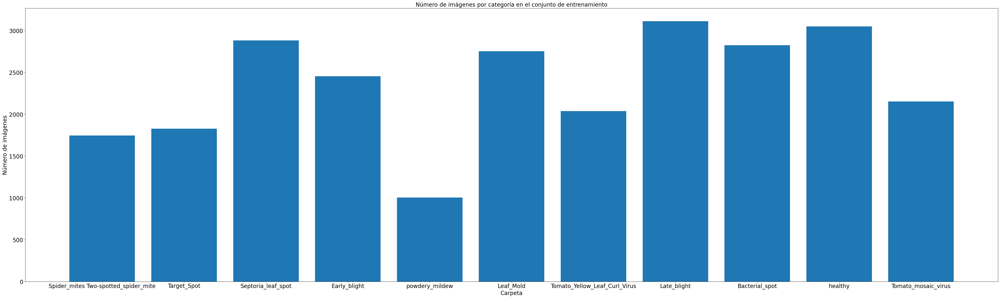

In [ ]:
import os
import matplotlib.pyplot as plt

train_dir = 'my_dataset/train'

disease_folders = os.listdir(train_dir)

num_images = []
labels = []
for folder in disease_folders:
    num_images.append(len(os.listdir(os.path.join(train_dir, folder))))
    labels.append(folder)

# Crear la gráfica
plt.figure(figsize=(50, 15))
plt.bar(labels, num_images)
plt.xticks(rotation='horizontal')
plt.xlabel('Carpeta', fontsize=20)
plt.ylabel('Número de imágenes', fontsize=20)
plt.title('Número de imágenes por categoría en el conjunto de entrenamiento', fontsize=20)

plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.tight_layout()

plt.savefig('NúmeroImagenesPorCategoria.png')
plt.show()


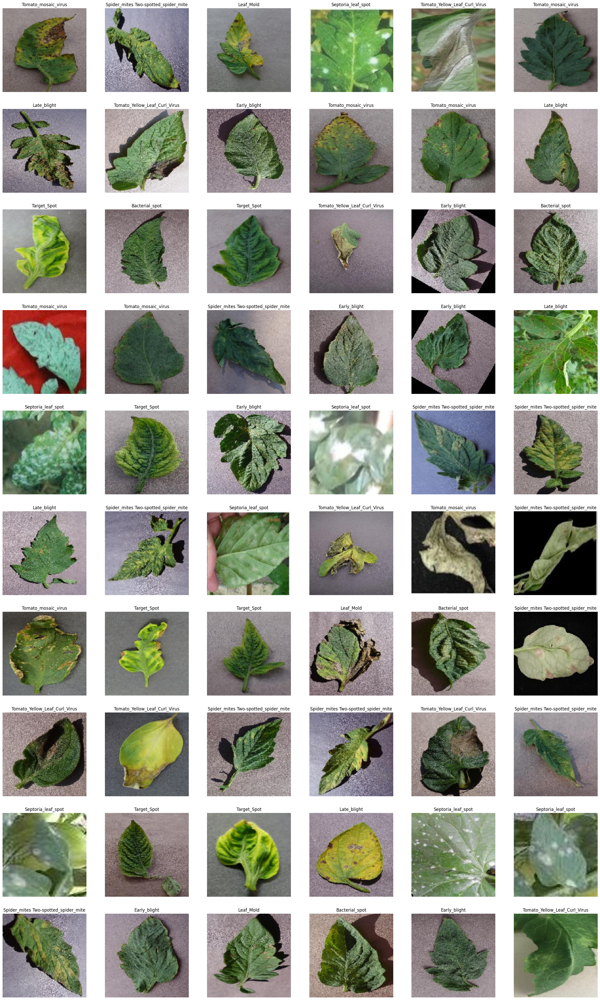

In [ ]:
class_labels = ['Bacterial_spot','Early_blight','Late_blight','Leaf_Mold',
 'Septoria_leaf_spot','Spider_mites Two-spotted_spider_mite','Target_Spot',
 'Tomato_Yellow_Leaf_Curl_Virus','Tomato_mosaic_virus','healthy','powdery_mildew']
len(class_labels)

plt.figure(figsize=(30,50))
for i in range(60):
    idx1 = np.random.randint(0, 5000)
    plt.subplot(10,6,i+1)
    plt.imshow(valid_images[idx1])
    plt.title(class_labels[valid_labels[idx1]])
    plt.axis("off")

In [1]:
from plantcv import plantcv as pcv
import warnings
warnings.filterwarnings('ignore')
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.metrics import classification_report , confusion_matrix , accuracy_score , auc
from sklearn.model_selection import train_test_split
import cv2
#from google.colab.patches import cv2_imshow
from PIL import Image
import tensorflow as tf
from tensorflow import keras
from keras import Sequential
from keras.layers import Input, Dense,Conv2D , MaxPooling2D, Flatten,BatchNormalization,Dropout
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import tensorflow_hub as hub
from plantcv import plantcv as pcv

labels = {'Bacterial_spot':0,
 'Early_blight':1,
 'Late_blight':2,
 'Leaf_Mold':3,
 'Septoria_leaf_spot':4,
 'Spider_mites Two-spotted_spider_mite':5,
 'Target_Spot':6,
 'Tomato_Yellow_Leaf_Curl_Virus':7,
 'Tomato_mosaic_virus':8,
 'healthy':9,
 'powdery_mildew':10}

train_dir = 'my_dataset/train'
valid_dir = 'my_dataset/valid'

def load_images_from_dir(directory):
    images = []
    labels = []
    classes = os.listdir(directory)
    class_to_index = {class_name: i for i, class_name in enumerate(classes)}
    for class_name in classes:
        class_dir = os.path.join(directory, class_name)
        images_in_class = os.listdir(class_dir)
        for image_name in images_in_class:
            image_path = os.path.join(class_dir, image_name)
            image = load_img(image_path, target_size=(150, 150))
            image_array = img_to_array(image)
            image_array /= 255.0  # Normalizar los píxeles
            images.append(image_array)
            labels.append(class_to_index[class_name])
    return np.array(images), np.array(labels)

train_images, train_labels = load_images_from_dir(train_dir)
valid_images, valid_labels = load_images_from_dir(valid_dir)

combined_images = np.concatenate((train_images, valid_images), axis=0)
combined_labels = np.concatenate((train_labels, valid_labels), axis=0)

del train_images, train_labels, valid_images, valid_labels

iluminacion_images = []
gray_images = []
gaussian_kernel = (7, 7)
gaussian_images = []
dilatacion1_images = []
dilatacion2_images = []
erosion1_images=[]
erosion2_images=[]
binary_images=[]
gray2_images=[]
mask_images=[]

balanced_images = []
for image in combined_images:
    balanced_image = pcv.white_balance(image, mode='hist', roi=None)
    balanced_images.append(balanced_image)

for image in combined_images:
    gray_image = pcv.rgb2gray_lab(image, channel='b')
    gray_images.append(gray_image)

del combined_images

for image in gray_images:
    iluminacion_image = pcv.transform.nonuniform_illumination(img=image, ksize=31)
    iluminacion_images.append(iluminacion_image)

del gray_images

for image in iluminacion_images:
    erosion1_image = pcv.erode(gray_img=image, ksize=3, i=1)
    erosion1_images.append(erosion1_image)

del iluminacion_images

for image in erosion1_images:
    dilatacion1_image = pcv.dilate(gray_img=image, ksize=3, i=1)
    dilatacion1_images.append(dilatacion1_image)

del erosion1_images

for image in dilatacion1_images:
    dilatacion2_image = pcv.dilate(gray_img=image, ksize=3, i=1)
    dilatacion2_images.append(dilatacion2_image)

del dilatacion1_images

for image in dilatacion2_images:
    erosion2_image = pcv.erode(gray_img=image, ksize=3, i=1)
    erosion2_images.append(erosion2_image)

del dilatacion2_images

for image in erosion2_images:
    #if image.dtype != 'uint8':
    gray_image = image.astype('uint8')
    binary_image = pcv.threshold.otsu(gray_image, max_value=255, object_type="dark")
    binary_images.append(binary_image)

#for image in erosion2_images:
 #   masked_image = pcv.apply_mask(img=image, mask=binary_image, mask_color='white')
 #   mask_images.append(masked_image)

blue_frecuency=[]
green_frecuency=[]
red_frecuency=[]
lightness_frequencies=[]
hue_frequencies=[]
saturation_frequencies=[]
value_frequencies=[]
hue_circular_mean=[]


prev_backend = plt.get_backend()
plt.switch_backend('Agg')

for i,image in enumerate(balanced_images):

    id_objects, obj_hierarchy = pcv.find_objects(img=image, mask=binary_images[i])
    height, width = image.shape[:2]

    x = int(0.1 * width)
    y = int(0.1 * height)
    w = int(0.8 * width)
    h = int(0.8 * height)

    x = max(0, x)
    x = min(width, x)
    y = max(0, y)
    y=min(height,y)
    w = min(width - x, w)
    h = min(height - y, h)

    roi_contour, roi_hierarchy = pcv.roi.rectangle(img=image, x=x, y=y, h=h, w=w)

    kept_objs, kept_h, kept_mask, obj_area = pcv.roi_objects(img=image, roi_contour=roi_contour,
                                                             roi_hierarchy=roi_hierarchy,
                                                             object_contour=id_objects,
                                                             obj_hierarchy=obj_hierarchy,
                                                             roi_type="partial")

    plant_obj, mask = pcv.object_composition(img=image, contours=kept_objs, hierarchy=kept_h)

    pcv.analyze_color(image, mask,hist_plot_type=None)
    blue_frecuency_var = pcv.outputs.observations['default']['blue_frequencies']['value']
    blue_frecuency.append(blue_frecuency_var)
    green_frecuency_var = pcv.outputs.observations['default']['green_frequencies']['value']
    green_frecuency.append(green_frecuency_var)
    red_frecuency_var = pcv.outputs.observations['default']['red_frequencies']['value']
    red_frecuency.append(red_frecuency_var)
    lightness_frecuency_var = pcv.outputs.observations['default']['lightness_frequencies']['value']
    lightness_frequencies.append(lightness_frecuency_var)
    hue_frecuency_var = pcv.outputs.observations['default']['hue_frequencies']['value']
    hue_frequencies.append(hue_frecuency_var)
    saturation_frequencies_var = pcv.outputs.observations['default']['saturation_frequencies']['value']
    saturation_frequencies.append(saturation_frequencies_var)
    value_frequencies_var = pcv.outputs.observations['default']['value_frequencies']['value']
    value_frequencies.append(value_frequencies_var)
    hue_circular_mean_var = pcv.outputs.observations['default']['hue_circular_mean']['value']
    hue_circular_mean.append(hue_circular_mean_var)
    #plants=i
    #plant.append(plants)

plt.switch_backend(prev_backend)
color_plant_data = {
    #'Id_Plant': plant,
    'Frecuencia_Azul': blue_frecuency,
    'Frecuencia_Verde': green_frecuency,
    'Frecuencia_Roja': red_frecuency,
    'Frecuencia_Luminica': lightness_frequencies,
    'Frecuencia_Tono': hue_frequencies,
    'Frecuencia_Saturacion': saturation_frequencies,
    'Frecuencia_Valor': value_frequencies,
    'Frecuencia_Circular': hue_circular_mean
}

df_Colores_Planta = pd.DataFrame(color_plant_data)
del red_frecuency, lightness_frequencies, hue_frequencies, saturation_frequencies, value_frequencies, hue_circular_mean
#del blue_frecuency, green_frecuency, red_frecuency, lightness_frequencies, hue_frequencies, saturation_frequencies, value_frequencies, hue_circular_mean, plant

In [ ]:
plant_data = []
solidity_list = []
area_list = []
perimeter_list = []
width_list = []
height_list = []

for i,image in enumerate(balanced_images):

    id_objects, obj_hierarchy = pcv.find_objects(img=image, mask=binary_images[i])
    height, width = image.shape[:2]

    x = int(0.1 * width)
    y = int(0.1 * height)
    w = int(0.8 * width)
    h = int(0.8 * height)

    x = max(0, x)
    x = min(width, x)
    y = max(0, y)
    y=min(height,y)
    w = min(width - x, w)
    h = min(height - y, h)

    roi_contour, roi_hierarchy = pcv.roi.rectangle(img=image, x=x, y=y, h=h, w=w)

    kept_objs, kept_h, kept_mask, obj_area = pcv.roi_objects(img=image, roi_contour=roi_contour,
                                                             roi_hierarchy=roi_hierarchy,
                                                             object_contour=id_objects,
                                                             obj_hierarchy=obj_hierarchy,
                                                             roi_type="partial")

    plant_obj, mask = pcv.object_composition(img=image, contours=kept_objs, hierarchy=kept_h)

    shape_data = pcv.analyze_object(img=image, obj=plant_obj, mask=mask)


    solidity = pcv.outputs.observations['default']['solidity']['value']
    solidity_list.append(solidity)
    area = pcv.outputs.observations['default']['area']['value']
    area_list.append(area)
    perimeter = pcv.outputs.observations['default']['perimeter']['value']
    perimeter_list.append(perimeter)
    width = pcv.outputs.observations['default']['width']['value']
    width_list.append(width)
    height = pcv.outputs.observations['default']['height']['value']
    height_list.append(height)
    plants=i
    plant_data.append(plants)

datos_planta_size = {
    'plant': plant_data,
    'solidity': solidity_list,
    'area': area_list,
    'perimeter': perimeter_list,
    'width': width_list,
    'height': height_list
}

df_Tamaño_Planta = pd.DataFrame(datos_planta_size)

del solidity_list, area_list, perimeter_list, width_list, height_list,plant_data

In [2]:
df_Colores_Planta_prueba1=df_Colores_Planta.copy()
df_Colores_Planta_prueba2=df_Colores_Planta.copy()
df_Colores_Planta_prueba3=df_Colores_Planta.copy()

Primera Prueba: Se realizara una primer prueba con una sola PCA.

In [5]:
from sklearn.decomposition import PCA

columnas_frecuencia_color = [ 'Frecuencia_Azul','Frecuencia_Verde','Frecuencia_Roja', 'Frecuencia_Luminica', 'Frecuencia_Tono', 'Frecuencia_Saturacion', 'Frecuencia_Valor']

for columna in columnas_frecuencia_color:

    X_columna = np.stack(df_Colores_Planta_prueba1[columna].values)

    X_columna_reshaped = X_columna.reshape(X_columna.shape[0], -1)

    pca = PCA(n_components=1)
    componente_principal_columna = pca.fit_transform(X_columna_reshaped)

    df_Colores_Planta_prueba1[f'PCA_Componente_Principal_{columna}'] = componente_principal_columna

In [7]:
df_Colores_Planta_prueba1 = df_Colores_Planta_prueba1[df_Colores_Planta_prueba1.columns[df_Colores_Planta_prueba1.columns.str.contains('PCA_Componente') | df_Colores_Planta_prueba1.columns.str.contains('Frecuencia_Circular')]]
print(df_Colores_Planta_prueba1.dtypes)

Frecuencia_Circular                               float64
PCA_Componente_Principal_Frecuencia_Azul          float64
PCA_Componente_Principal_Frecuencia_Verde         float64
PCA_Componente_Principal_Frecuencia_Roja          float64
PCA_Componente_Principal_Frecuencia_Luminica      float64
PCA_Componente_Principal_Frecuencia_Tono          float64
PCA_Componente_Principal_Frecuencia_Saturacion    float64
PCA_Componente_Principal_Frecuencia_Valor         float64
dtype: object


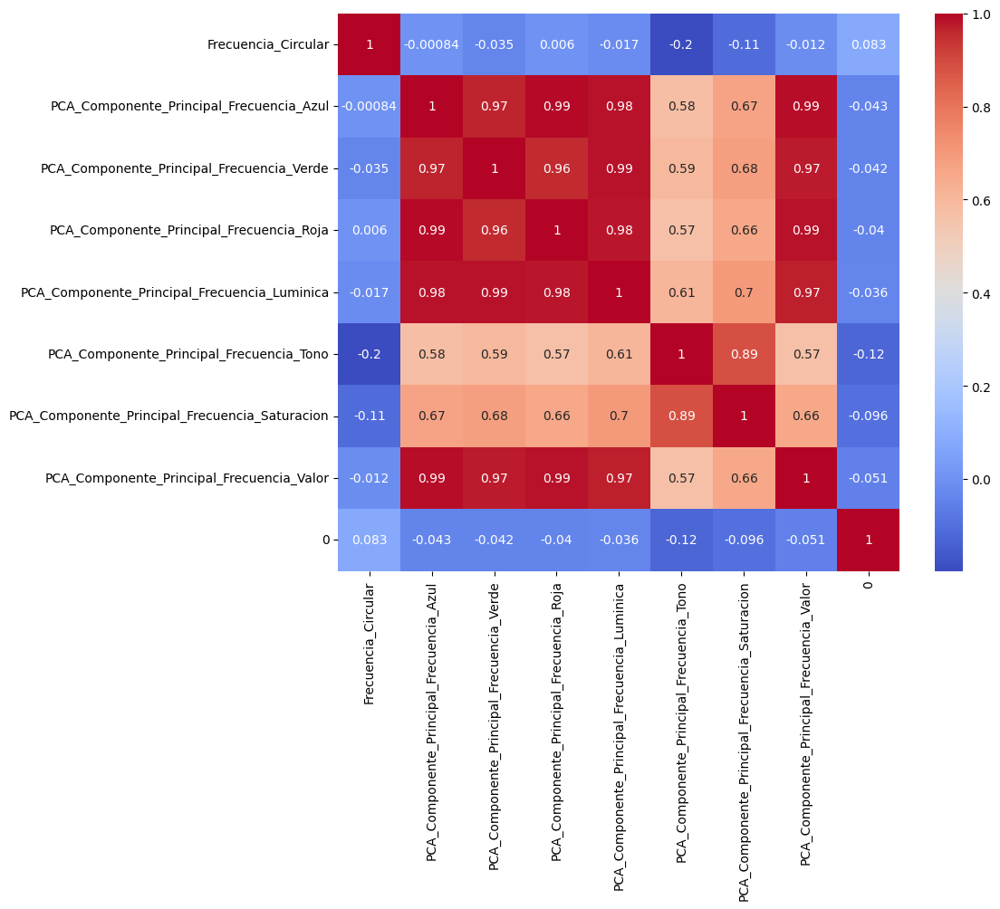

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns

#df_Colores_Planta = df_Colores_Planta[df_Colores_Planta.columns[df_Colores_Planta.columns.str.contains('PCA_Componente') | df_Colores_Planta.columns.str.contains('Frecuencia_Circular')]]
com_df=pd.DataFrame(combined_labels)

df_merged_prueba1 = pd.concat([df_Colores_Planta_prueba1, com_df], axis=1)
#
#df_merged_prueba1 = df_merged_prueba1[[ 'PCA_Componente_Principal_Frecuencia_Roja','PCA_Componente_Principal_Frecuencia_Tono','PCA_Componente_Principal_Frecuencia_Saturacion','PCA_Componente_Principal_Frecuencia_Luminica', 'PCA_Componente_Principal_Frecuencia_Valor']]

correlation_matrix = df_merged_prueba1.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')

plt.savefig('correlation_matrix.png')

plt.show()
df_merged_prueba1 = df_merged_prueba1.drop(columns=[0])

In [12]:
print(df_merged_prueba1.dtypes)

Frecuencia_Circular                               float64
PCA_Componente_Principal_Frecuencia_Azul          float64
PCA_Componente_Principal_Frecuencia_Verde         float64
PCA_Componente_Principal_Frecuencia_Roja          float64
PCA_Componente_Principal_Frecuencia_Luminica      float64
PCA_Componente_Principal_Frecuencia_Tono          float64
PCA_Componente_Principal_Frecuencia_Saturacion    float64
PCA_Componente_Principal_Frecuencia_Valor         float64
dtype: object


In [14]:
train_ratio = 0.6  # Porcentaje para entrenamiento
valid_ratio = 0.2  # Porcentaje para validación
test_ratio = 0.2   # Porcentaje para prueba

x_train, x_temp, y_train, y_temp = train_test_split(balanced_images, combined_labels, test_size=(1 - train_ratio), random_state=42)
x_valid, x_test, y_valid, y_test = train_test_split(x_temp, y_temp, test_size=test_ratio / (test_ratio + valid_ratio), random_state=42)

train_df, temp_df = train_test_split(df_merged_prueba1, test_size=(1 - train_ratio), random_state=42)
val_df,test_df = train_test_split(temp_df, test_size=test_ratio / (test_ratio + valid_ratio), random_state=42)

input_dim = train_df.shape[1]

print(train_df.shape[1])
print(len(x_train))
print(len(x_train))
print(len(y_train))
print('---------------------------')
print(len(val_df))
print(len(x_valid))
print(len(y_valid))

8
19520
19520
19520
---------------------------
6507
6507
6507


In [15]:
from keras import regularizers
model = keras.Sequential([
    keras.layers.Dense(288, activation='relu', input_shape=(train_df.shape[1],)),
    keras.layers.Dropout(0.1),
    keras.layers.Dense(192, activation='relu'),
    keras.layers.Dropout(0.1),
    keras.layers.Dense(192, activation='relu'),
    keras.layers.Dropout(0.2),
    keras.layers.Dense(11, activation='softmax')
])

model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

history = model.fit(train_df, y_train, epochs=200, batch_size=256,validation_data=(val_df, y_valid))

Epoch 1/200
77/77 [==============================] - 4s 28ms/step - loss: 3.9970 - accuracy: 0.1162 - val_loss: 2.3203 - val_accuracy: 0.1531
Epoch 2/200
77/77 [==============================] - 2s 33ms/step - loss: 2.3618 - accuracy: 0.1384 - val_loss: 2.2716 - val_accuracy: 0.1623
Epoch 3/200
77/77 [==============================] - 1s 7ms/step - loss: 2.2982 - accuracy: 0.1442 - val_loss: 2.2765 - val_accuracy: 0.1497
Epoch 4/200
77/77 [==============================] - 3s 42ms/step - loss: 2.2808 - accuracy: 0.1441 - val_loss: 2.2486 - val_accuracy: 0.1538
Epoch 5/200
77/77 [==============================] - 1s 8ms/step - loss: 2.2687 - accuracy: 0.1500 - val_loss: 2.2357 - val_accuracy: 0.1480
Epoch 6/200
77/77 [==============================] - 2s 32ms/step - loss: 2.2570 - accuracy: 0.1515 - val_loss: 2.2281 - val_accuracy: 0.1548
Epoch 7/200
77/77 [==============================] - 1s 7ms/step - loss: 2.2460 - accuracy: 0.1552 - val_loss: 2.2165 - val_accuracy: 0.1781
Epoch 8/2

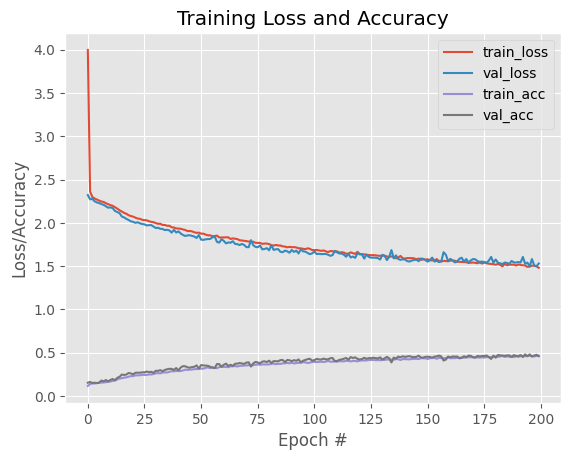

In [16]:
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, 200), history.history["loss"], label="train_loss")
plt.plot(np.arange(0, 200), history.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, 200), history.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, 200), history.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()
plt.show()

In [17]:
from sklearn.metrics import classification_report
x_test_np = np.array(test_df)
x_test = np.repeat(x_test_np[..., np.newaxis], 3, -1)
# Evaluando el modelo de predicción con las imágenes de test
print("[INFO]: Evaluando red neuronal...")
predictions = model.predict(test_df, batch_size=32)
#print(y_te[0])
#print(predictions[0])
print(classification_report(y_test, predictions.argmax(axis=1)))

[INFO]: Evaluando red neuronal...
204/204 [==============================] - 2s 10ms/step
              precision    recall  f1-score   support

           0       0.45      0.57      0.50       238
           1       0.49      0.32      0.39       794
           2       0.63      0.68      0.65       794
           3       0.64      0.58      0.61       558
           4       0.50      0.48      0.49       731
           5       0.41      0.41      0.41       730
           6       0.46      0.45      0.45       710
           7       0.41      0.37      0.39       495
           8       0.37      0.60      0.46       447
           9       0.40      0.42      0.41       451
          10       0.36      0.37      0.37       559

    accuracy                           0.47      6507
   macro avg       0.47      0.48      0.47      6507
weighted avg       0.48      0.47      0.47      6507



Se realizara una segunda prueba con una variabilidad del 70%

In [19]:
from sklearn.decomposition import PCA
import numpy as np
import pandas as pd

columnas_frecuencia_color = [ 'Frecuencia_Azul','Frecuencia_Verde','Frecuencia_Roja', 'Frecuencia_Luminica', 'Frecuencia_Saturacion', 'Frecuencia_Valor']

df_Colores_Planta_pca_1 = df_Colores_Planta_prueba2.copy()

umbral_variabilidad = 0.7
umbral_variabilidad_minima = 0.5

for columna in columnas_frecuencia_color:
    X_columna = np.stack(df_Colores_Planta_pca_1[columna].values)

    X_columna_reshaped = X_columna.reshape(X_columna.shape[0], -1)

    pca = PCA()
    pca.fit(X_columna_reshaped)

    variabilidad_acumulada = np.cumsum(pca.explained_variance_ratio_)
    num_componentes = np.argmax(variabilidad_acumulada >= umbral_variabilidad) + 1

    pca = PCA(n_components=num_componentes)
    componentes_principales = pca.fit_transform(X_columna_reshaped)

    variabilidad = np.sum(pca.explained_variance_ratio_)

    if variabilidad >= umbral_variabilidad_minima:
        for i in range(num_componentes):
            df_Colores_Planta_pca_1[f'PCA_Componente_{i+1}_{columna}'] = componentes_principales[:, i]
        print(f"{columna}: {num_componentes} componentes principales añadidas con {variabilidad:.2%} de variabilidad explicada.")
    else:
        print(f"{columna}: columnas eliminadas porque la variabilidad explicada ({variabilidad:.2%}) es menor al umbral mínimo ({umbral_variabilidad_minima:.2%}).")

for columna in columnas_frecuencia_color:
    X_columna = np.stack(df_Colores_Planta_pca_1[columna].values)
    X_columna_reshaped = X_columna.reshape(X_columna.shape[0], -1)

    pca = PCA()
    pca.fit(X_columna_reshaped)
    variabilidad_acumulada = np.cumsum(pca.explained_variance_ratio_)
    num_componentes = np.argmax(variabilidad_acumulada >= umbral_variabilidad) + 1

    pca = PCA(n_components=num_componentes)
    pca.fit(X_columna_reshaped)


Frecuencia_Azul: 3 componentes principales añadidas con 70.36% de variabilidad explicada.
Frecuencia_Verde: 4 componentes principales añadidas con 72.62% de variabilidad explicada.
Frecuencia_Roja: 3 componentes principales añadidas con 70.84% de variabilidad explicada.
Frecuencia_Luminica: 4 componentes principales añadidas con 75.21% de variabilidad explicada.
Frecuencia_Saturacion: 6 componentes principales añadidas con 70.87% de variabilidad explicada.
Frecuencia_Valor: 2 componentes principales añadidas con 71.16% de variabilidad explicada.


In [22]:
df_Colores_Planta_pca_1 = df_Colores_Planta_pca_1[df_Colores_Planta_pca_1.columns[df_Colores_Planta_pca_1.columns.str.contains('PCA_Componente') | df_Colores_Planta_pca_1.columns.str.contains('Frecuencia_Circular')]]
print(df_Colores_Planta_pca_1.dtypes)

Frecuencia_Circular                       float64
PCA_Componente_1_Frecuencia_Azul          float64
PCA_Componente_2_Frecuencia_Azul          float64
PCA_Componente_3_Frecuencia_Azul          float64
PCA_Componente_1_Frecuencia_Verde         float64
PCA_Componente_2_Frecuencia_Verde         float64
PCA_Componente_3_Frecuencia_Verde         float64
PCA_Componente_4_Frecuencia_Verde         float64
PCA_Componente_1_Frecuencia_Roja          float64
PCA_Componente_2_Frecuencia_Roja          float64
PCA_Componente_3_Frecuencia_Roja          float64
PCA_Componente_1_Frecuencia_Luminica      float64
PCA_Componente_2_Frecuencia_Luminica      float64
PCA_Componente_3_Frecuencia_Luminica      float64
PCA_Componente_4_Frecuencia_Luminica      float64
PCA_Componente_1_Frecuencia_Saturacion    float64
PCA_Componente_2_Frecuencia_Saturacion    float64
PCA_Componente_3_Frecuencia_Saturacion    float64
PCA_Componente_4_Frecuencia_Saturacion    float64
PCA_Componente_5_Frecuencia_Saturacion    float64


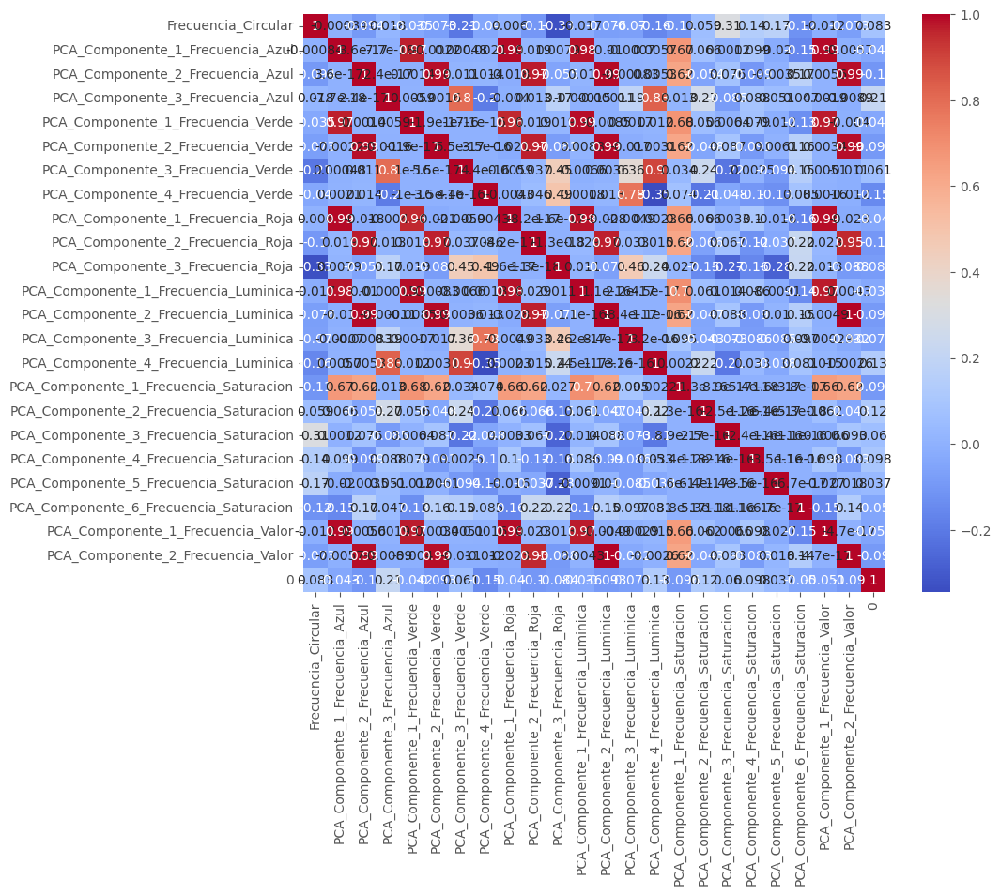

In [94]:
import matplotlib.pyplot as plt
import seaborn as sns

#df_Colores_Planta = df_Colores_Planta[df_Colores_Planta.columns[df_Colores_Planta.columns.str.contains('PCA_Componente') | df_Colores_Planta.columns.str.contains('Frecuencia_Circular')]]
com_df=pd.DataFrame(combined_labels)

df_merged_prueba2 = pd.concat([df_Colores_Planta_pca_1, com_df], axis=1)
#
#df_merged_prueba1 = df_merged_prueba1[[ 'PCA_Componente_Principal_Frecuencia_Roja','PCA_Componente_Principal_Frecuencia_Tono','PCA_Componente_Principal_Frecuencia_Saturacion','PCA_Componente_Principal_Frecuencia_Luminica', 'PCA_Componente_Principal_Frecuencia_Valor']]

correlation_matrix = df_merged_prueba2.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')

plt.savefig('correlation_matrix.png')

plt.show()
df_merged_prueba2 = df_merged_prueba2.drop(columns=[0])

In [95]:
train_ratio = 0.6  # Porcentaje para entrenamiento
valid_ratio = 0.2  # Porcentaje para validación
test_ratio = 0.2   # Porcentaje para prueba

train_df_1, temp_df = train_test_split(df_merged_prueba2, test_size=(1 - train_ratio), random_state=42)
val_df_1,test_df_1 = train_test_split(temp_df, test_size=test_ratio / (test_ratio + valid_ratio), random_state=42)

input_dim = train_df.shape[1]

print(train_df_1.shape[1])
print(len(train_df_1))
print(len(x_train))
print(len(y_train))
print('---------------------------')
print(len(val_df_1))
print(len(x_valid))
print(len(y_valid))

23
19520
19520
19520
---------------------------
6507
6507
6507


In [96]:
from keras import regularizers
model = keras.Sequential([
    keras.layers.Dense(288, activation='relu', input_shape=(train_df.shape[1],)),
    keras.layers.Dropout(0.1),
    keras.layers.Dense(192, activation='relu'),
    keras.layers.Dropout(0.1),
    keras.layers.Dense(192, activation='relu'),
    keras.layers.Dropout(0.2),
    keras.layers.Dense(11, activation='softmax')
])

model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)
history = model.fit(train_df_1, y_train, epochs=200, batch_size=256,validation_data=(val_df_1, y_valid),callbacks=[callback])

Epoch 1/200
77/77 [==============================] - 2s 14ms/step - loss: 3.6970 - accuracy: 0.1288 - val_loss: 2.3086 - val_accuracy: 0.1703
Epoch 2/200
77/77 [==============================] - 1s 12ms/step - loss: 2.3089 - accuracy: 0.1565 - val_loss: 2.2367 - val_accuracy: 0.2092
Epoch 3/200
77/77 [==============================] - 1s 11ms/step - loss: 2.2332 - accuracy: 0.1844 - val_loss: 2.1029 - val_accuracy: 0.2488
Epoch 4/200
77/77 [==============================] - 1s 11ms/step - loss: 2.1354 - accuracy: 0.2168 - val_loss: 2.0208 - val_accuracy: 0.2736
Epoch 5/200
77/77 [==============================] - 1s 11ms/step - loss: 2.0764 - accuracy: 0.2307 - val_loss: 1.9567 - val_accuracy: 0.2822
Epoch 6/200
77/77 [==============================] - 1s 10ms/step - loss: 2.0336 - accuracy: 0.2487 - val_loss: 1.9192 - val_accuracy: 0.2957
Epoch 7/200
77/77 [==============================] - 1s 10ms/step - loss: 1.9997 - accuracy: 0.2609 - val_loss: 1.8845 - val_accuracy: 0.3200
Epoch 

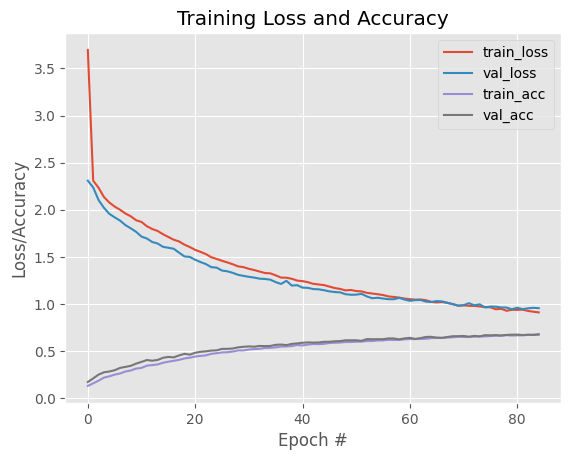

In [97]:
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, 85), history.history["loss"], label="train_loss")
plt.plot(np.arange(0, 85), history.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, 85), history.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, 85), history.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()
plt.show()

In [98]:
from sklearn.metrics import classification_report
x_test_np = np.array(test_df_1)
x_test = np.repeat(x_test_np[..., np.newaxis], 3, -1)
# Evaluando el modelo de predicción con las imágenes de test
print("[INFO]: Evaluando red neuronal...")
predictions = model.predict(test_df_1, batch_size=32)
#print(y_te[0])
#print(predictions[0])
print(classification_report(y_test, predictions.argmax(axis=1)))

[INFO]: Evaluando red neuronal...
204/204 [==============================] - 1s 2ms/step
              precision    recall  f1-score   support

           0       0.59      0.75      0.66       238
           1       0.64      0.52      0.57       794
           2       0.80      0.85      0.83       794
           3       0.84      0.87      0.86       558
           4       0.71      0.72      0.71       731
           5       0.73      0.62      0.67       730
           6       0.60      0.65      0.63       710
           7       0.53      0.53      0.53       495
           8       0.73      0.68      0.71       447
           9       0.61      0.72      0.66       451
          10       0.63      0.61      0.62       559

    accuracy                           0.68      6507
   macro avg       0.67      0.69      0.68      6507
weighted avg       0.68      0.68      0.68      6507



In [34]:
x_train = np.array(x_train)
train_df_1 = np.array(train_df_1)
y_train = np.array(y_train)

x_valid = np.array(x_valid)
val_df_1 = np.array(val_df_1)
y_valid = np.array(y_valid)

print(f"Tamaño de x_train: {x_train.shape[0]}")
print(f"Tamaño de train_df_1: {train_df_1.shape[0]}")
print(f"Tamaño de y_train: {y_train.shape[0]}")

Tamaño de x_train: 19520
Tamaño de train_df_1: 19520
Tamaño de y_train: 19520


In [35]:
import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Flatten, Dropout, concatenate

input_shape_vgg = (150, 150, 3)
base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape_vgg)

for layer in base_model.layers:
    layer.trainable = False

input_shape_dense = (train_df.shape[1],)
dense_input = Input(shape=input_shape_dense)
x = Dense(288, activation='relu')(dense_input)
x = Dropout(0.1)(x)
x = Dense(192, activation='relu')(x)
x = Dropout(0.1)(x)
x = Dense(192, activation='relu')(x)
x = Dropout(0.2)(x)

vgg_input = Input(shape=input_shape_vgg)
vgg_output = base_model(vgg_input)
vgg_output = Flatten()(vgg_output)

combined = concatenate([vgg_output, x])

output = Dense(11, activation='softmax')(combined)

model = Model(inputs=[vgg_input, dense_input], outputs=output)

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)

print("[INFO]: Entrenando la red...")
history = model.fit(
    [x_train, train_df_1], y_train,
    epochs=10,
    batch_size=32,
    validation_data=([x_valid, val_df_1], y_valid),
    callbacks=[callback]
)


[INFO]: Entrenando la red...
Epoch 1/10
610/610 [==============================] - 1609s 3s/step - loss: 5.8613 - accuracy: 0.6643 - val_loss: 4.9361 - val_accuracy: 0.7395
Epoch 2/10
610/610 [==============================] - 1593s 3s/step - loss: 2.5098 - accuracy: 0.8322 - val_loss: 4.7333 - val_accuracy: 0.7785
Epoch 3/10
610/610 [==============================] - 1592s 3s/step - loss: 1.7758 - accuracy: 0.8801 - val_loss: 4.7650 - val_accuracy: 0.7852
Epoch 4/10
610/610 [==============================] - 1598s 3s/step - loss: 1.3159 - accuracy: 0.9062 - val_loss: 5.8502 - val_accuracy: 0.7785
Epoch 5/10
610/610 [==============================] - 1604s 3s/step - loss: 1.0689 - accuracy: 0.9237 - val_loss: 5.9225 - val_accuracy: 0.7968


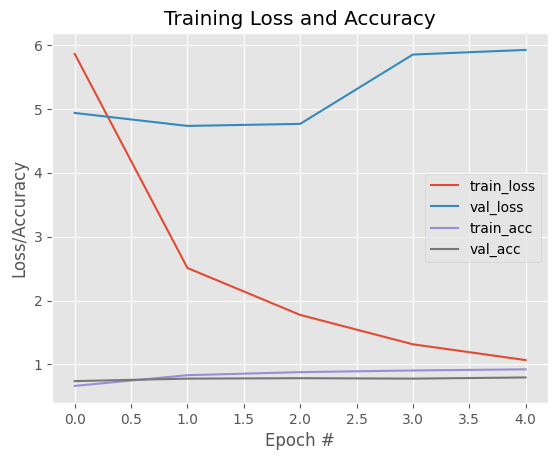

In [36]:
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, 5), history.history["loss"], label="train_loss")
plt.plot(np.arange(0, 5), history.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, 5), history.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, 5), history.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()
plt.show()

Prueba 3: Tenemos que con la variabilidad al 70% el modelo obtuvo una precisión del 77%. Por lo que procederemos a probar con las enfermedades con las que se cuente con mayor cantidad de información y se excluiran aquellas que no tengan casi información para observar el comportamiento de la red neuronal.

In [59]:
df_Colores_Planta_2_prueba=df_Colores_Planta_pca_1.copy()
com_df=pd.DataFrame(combined_labels)
df_merged_prueba3 = pd.concat([df_Colores_Planta_2_prueba, com_df], axis=1)

enfermedades_filtro = [1, 2, 5, 6, 4, 10]
df_merged_prueba3 = df_merged_prueba3[df_merged_prueba3[0].isin(enfermedades_filtro)]
com_df=com_df[com_df[0].isin(enfermedades_filtro)]

label_mapping = {1: 0, 2: 1, 4: 2, 5: 3, 6: 4, 10: 5}

df_merged_prueba3[0] = df_merged_prueba3[0].map(label_mapping)
com_df[0] = com_df[0].map(label_mapping)

conteo_numeros = com_df[0].value_counts()
print(conteo_numeros)

0
0    3905
1    3856
3    3628
4    3558
2    3493
5    3098
Name: count, dtype: int64


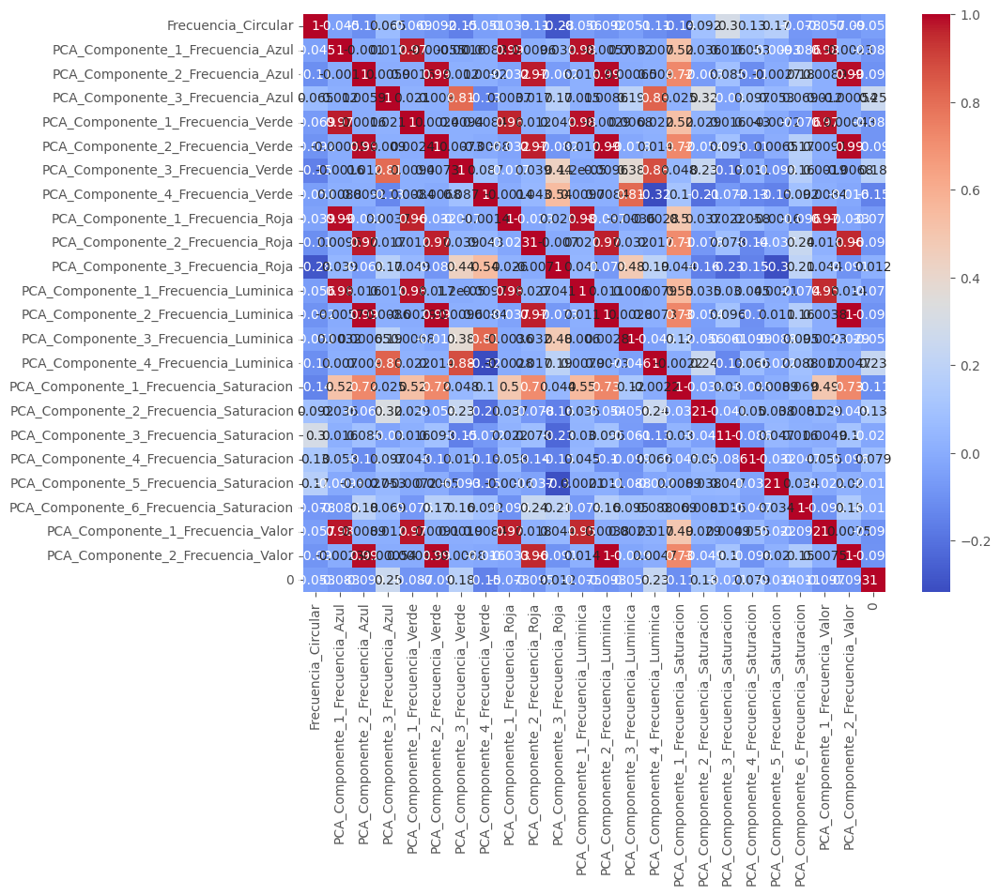

In [60]:
correlation_matrix = df_merged_prueba3.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')

plt.savefig('correlation_matrix.png')

plt.show()

df_merged_prueba3 = df_merged_prueba3.drop(columns=[0])



In [61]:
print(df_merged_prueba3.shape)

(21538, 23)


In [62]:
train_ratio = 0.6  # Porcentaje para entrenamiento
valid_ratio = 0.2  # Porcentaje para validación
test_ratio = 0.2   # Porcentaje para prueba

train_df_2, temp_df = train_test_split(df_merged_prueba3, test_size=(1 - train_ratio), random_state=42)
val_df_2,test_df_2 = train_test_split(temp_df, test_size=test_ratio / (test_ratio + valid_ratio), random_state=42)

y_df_2, y_df = train_test_split(com_df, test_size=(1 - train_ratio), random_state=42)
val_y_2,test_y_2 = train_test_split(y_df, test_size=test_ratio / (test_ratio + valid_ratio), random_state=42)


input_dim = train_df.shape[1]

print(train_df_2.shape[1])
print(len(train_df_2))
print(len(x_train))
print(len(y_df_2))
print('---------------------------')
print(len(val_df_2))
print(len(x_valid))
print(len(val_y_2))

23
12922
19520
12922
---------------------------
4308
6507
4308


In [73]:
from keras import regularizers
model = keras.Sequential([
    keras.layers.Dense(288, activation='relu', input_shape=(train_df_2.shape[1],)),
    keras.layers.Dropout(0.1),
    keras.layers.Dense(192, activation='relu'),
    keras.layers.Dropout(0.1),
    keras.layers.Dense(192, activation='relu'),
    keras.layers.Dropout(0.2),
    keras.layers.Dense(6, activation='softmax')
])
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)
model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

history = model.fit(train_df_2, y_df_2, epochs=200, batch_size=256,validation_data=(val_df_2, val_y_2),callbacks=[callback])

Epoch 1/200
51/51 [==============================] - 2s 12ms/step - loss: 4.2855 - accuracy: 0.2022 - val_loss: 1.7309 - val_accuracy: 0.2426
Epoch 2/200
51/51 [==============================] - 0s 8ms/step - loss: 1.8315 - accuracy: 0.2386 - val_loss: 1.6965 - val_accuracy: 0.2804
Epoch 3/200
51/51 [==============================] - 0s 8ms/step - loss: 1.7278 - accuracy: 0.2455 - val_loss: 1.6849 - val_accuracy: 0.2892
Epoch 4/200
51/51 [==============================] - 0s 8ms/step - loss: 1.6835 - accuracy: 0.2678 - val_loss: 1.6706 - val_accuracy: 0.2658
Epoch 5/200
51/51 [==============================] - 0s 8ms/step - loss: 1.6539 - accuracy: 0.2845 - val_loss: 1.6300 - val_accuracy: 0.3196
Epoch 6/200
51/51 [==============================] - 0s 8ms/step - loss: 1.6233 - accuracy: 0.3135 - val_loss: 1.5966 - val_accuracy: 0.3199
Epoch 7/200
51/51 [==============================] - 0s 8ms/step - loss: 1.5957 - accuracy: 0.3220 - val_loss: 1.5416 - val_accuracy: 0.3596
Epoch 8/200


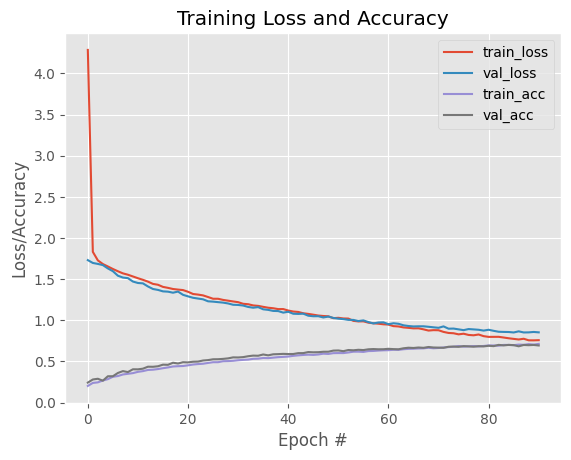

In [74]:
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, 91), history.history["loss"], label="train_loss")
plt.plot(np.arange(0, 91), history.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, 91), history.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, 91), history.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()
plt.show()

In [75]:
from sklearn.metrics import classification_report
x_test_np = np.array(test_df_2)
x_test = np.repeat(x_test_np[..., np.newaxis], 3, -1)
# Evaluando el modelo de predicción con las imágenes de test
print("[INFO]: Evaluando red neuronal...")
predictions = model.predict(test_df_2, batch_size=32)
#print(y_te[0])
#print(predictions[0])
print(classification_report(test_y_2, predictions.argmax(axis=1)))

[INFO]: Evaluando red neuronal...
135/135 [==============================] - 0s 2ms/step
              precision    recall  f1-score   support

           0       0.60      0.55      0.57       783
           1       0.85      0.88      0.86       758
           2       0.78      0.71      0.74       746
           3       0.65      0.68      0.66       689
           4       0.71      0.65      0.68       697
           5       0.59      0.72      0.65       635

    accuracy                           0.70      4308
   macro avg       0.70      0.70      0.69      4308
weighted avg       0.70      0.70      0.70      4308



Se realizara una ultima prueba con una variabilidad del 90%

In [83]:
from sklearn.decomposition import PCA
import numpy as np
import pandas as pd

columnas_frecuencia_color = [ 'Frecuencia_Azul','Frecuencia_Verde','Frecuencia_Roja', 'Frecuencia_Luminica', 'Frecuencia_Saturacion', 'Frecuencia_Valor']

df_Colores_Planta_pca_2 = df_Colores_Planta_prueba2.copy()

umbral_variabilidad = 0.9
umbral_variabilidad_minima = 0.5

for columna in columnas_frecuencia_color:
    X_columna = np.stack(df_Colores_Planta_pca_2[columna].values)

    X_columna_reshaped = X_columna.reshape(X_columna.shape[0], -1)

    pca = PCA()
    pca.fit(X_columna_reshaped)

    variabilidad_acumulada = np.cumsum(pca.explained_variance_ratio_)
    num_componentes = np.argmax(variabilidad_acumulada >= umbral_variabilidad) + 1

    pca = PCA(n_components=num_componentes)
    componentes_principales = pca.fit_transform(X_columna_reshaped)

    variabilidad = np.sum(pca.explained_variance_ratio_)

    if variabilidad >= umbral_variabilidad_minima:
        for i in range(num_componentes):
            df_Colores_Planta_pca_2[f'PCA_Componente_{i+1}_{columna}'] = componentes_principales[:, i]
        print(f"{columna}: {num_componentes} componentes principales añadidas con {variabilidad:.2%} de variabilidad explicada.")
    else:
        print(f"{columna}: columnas eliminadas porque la variabilidad explicada ({variabilidad:.2%}) es menor al umbral mínimo ({umbral_variabilidad_minima:.2%}).")

for columna in columnas_frecuencia_color:
    X_columna = np.stack(df_Colores_Planta_pca_2[columna].values)
    X_columna_reshaped = X_columna.reshape(X_columna.shape[0], -1)

    pca = PCA()
    pca.fit(X_columna_reshaped)
    variabilidad_acumulada = np.cumsum(pca.explained_variance_ratio_)
    num_componentes = np.argmax(variabilidad_acumulada >= umbral_variabilidad) + 1

    pca = PCA(n_components=num_componentes)
    pca.fit(X_columna_reshaped)


Frecuencia_Azul: 14 componentes principales añadidas con 90.02% de variabilidad explicada.
Frecuencia_Verde: 16 componentes principales añadidas con 90.45% de variabilidad explicada.
Frecuencia_Roja: 18 componentes principales añadidas con 90.24% de variabilidad explicada.
Frecuencia_Luminica: 11 componentes principales añadidas con 90.96% de variabilidad explicada.
Frecuencia_Saturacion: 23 componentes principales añadidas con 90.00% de variabilidad explicada.
Frecuencia_Valor: 12 componentes principales añadidas con 90.16% de variabilidad explicada.


In [84]:
df_Colores_Planta_pca_2 = df_Colores_Planta_pca_2[df_Colores_Planta_pca_2.columns[df_Colores_Planta_pca_2.columns.str.contains('PCA_Componente') | df_Colores_Planta_pca_2.columns.str.contains('Frecuencia_Circular')]]
print(df_Colores_Planta_pca_2.dtypes)

Frecuencia_Circular                   float64
PCA_Componente_1_Frecuencia_Azul      float64
PCA_Componente_2_Frecuencia_Azul      float64
PCA_Componente_3_Frecuencia_Azul      float64
PCA_Componente_4_Frecuencia_Azul      float64
                                       ...   
PCA_Componente_8_Frecuencia_Valor     float64
PCA_Componente_9_Frecuencia_Valor     float64
PCA_Componente_10_Frecuencia_Valor    float64
PCA_Componente_11_Frecuencia_Valor    float64
PCA_Componente_12_Frecuencia_Valor    float64
Length: 95, dtype: object


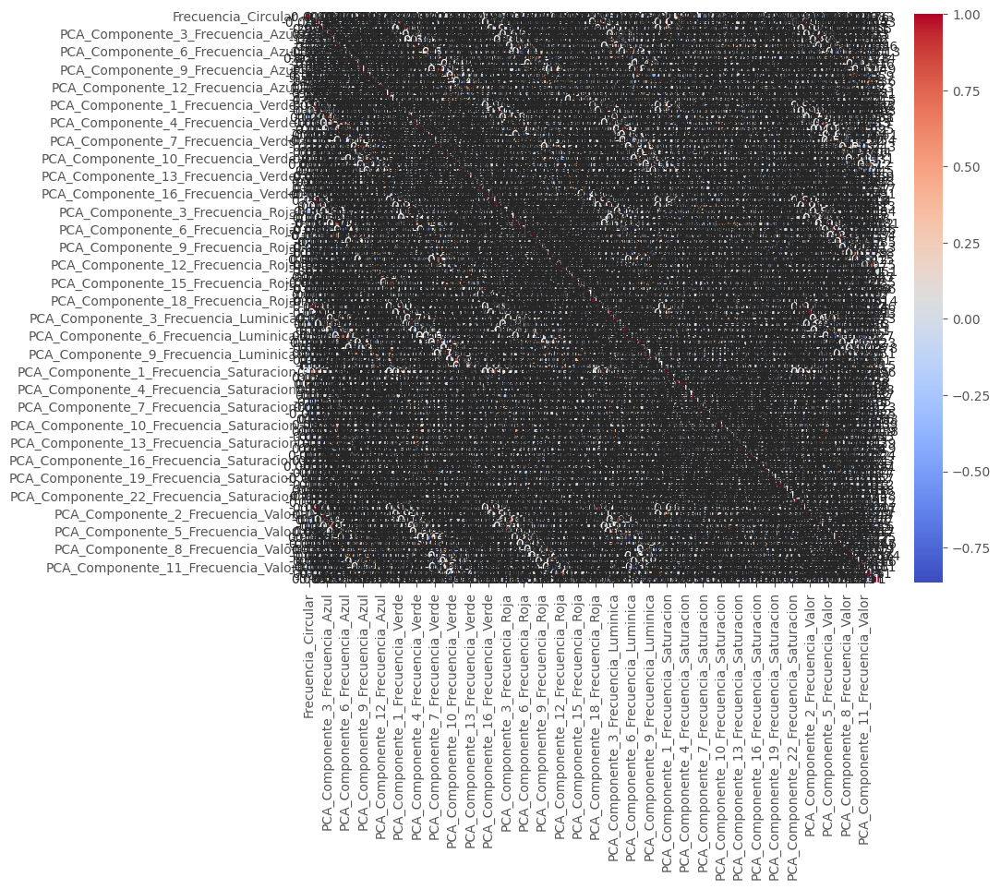

In [85]:
import matplotlib.pyplot as plt
import seaborn as sns

#df_Colores_Planta = df_Colores_Planta[df_Colores_Planta.columns[df_Colores_Planta.columns.str.contains('PCA_Componente') | df_Colores_Planta.columns.str.contains('Frecuencia_Circular')]]
com_df=pd.DataFrame(combined_labels)

df_merged_prueba4 = pd.concat([df_Colores_Planta_pca_2, com_df], axis=1)
#
#df_merged_prueba1 = df_merged_prueba1[[ 'PCA_Componente_Principal_Frecuencia_Roja','PCA_Componente_Principal_Frecuencia_Tono','PCA_Componente_Principal_Frecuencia_Saturacion','PCA_Componente_Principal_Frecuencia_Luminica', 'PCA_Componente_Principal_Frecuencia_Valor']]

correlation_matrix = df_merged_prueba4.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')

plt.savefig('correlation_matrix.png')

plt.show()
df_merged_prueba4 = df_merged_prueba4.drop(columns=[0])

In [86]:
train_ratio = 0.6  # Porcentaje para entrenamiento
valid_ratio = 0.2  # Porcentaje para validación
test_ratio = 0.2   # Porcentaje para prueba

train_df_4, temp_df = train_test_split(df_merged_prueba4, test_size=(1 - train_ratio), random_state=42)
val_df_4,test_df_4 = train_test_split(temp_df, test_size=test_ratio / (test_ratio + valid_ratio), random_state=42)

input_dim = train_df_4.shape[1]

print(train_df_4.shape[1])
print(len(train_df_4))
print(len(x_train))
print(len(y_train))
print('---------------------------')
print(len(val_df_4))
print(len(x_valid))
print(len(y_valid))

95
19520
19520
19520
---------------------------
6507
6507
6507


In [90]:
from keras import regularizers
model = keras.Sequential([
    keras.layers.Dense(288, activation='relu', input_shape=(train_df_4.shape[1],)),
    keras.layers.Dropout(0.1),
    keras.layers.Dense(192, activation='relu'),
    keras.layers.Dropout(0.1),
    keras.layers.Dense(192, activation='relu'),
    keras.layers.Dropout(0.2),
    keras.layers.Dense(11, activation='softmax')
])

model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)
history = model.fit(train_df_4, y_train, epochs=200, batch_size=256,validation_data=(val_df_4, y_valid),callbacks=[callback])

Epoch 1/200
77/77 [==============================] - 2s 12ms/step - loss: 3.8281 - accuracy: 0.1445 - val_loss: 2.1694 - val_accuracy: 0.2148
Epoch 2/200
77/77 [==============================] - 1s 9ms/step - loss: 2.1997 - accuracy: 0.2106 - val_loss: 1.9886 - val_accuracy: 0.3049
Epoch 3/200
77/77 [==============================] - 1s 10ms/step - loss: 2.0425 - accuracy: 0.2537 - val_loss: 1.8452 - val_accuracy: 0.3596
Epoch 4/200
77/77 [==============================] - 1s 9ms/step - loss: 1.9406 - accuracy: 0.2919 - val_loss: 1.7506 - val_accuracy: 0.3870
Epoch 5/200
77/77 [==============================] - 1s 9ms/step - loss: 1.8492 - accuracy: 0.3291 - val_loss: 1.6662 - val_accuracy: 0.4077
Epoch 6/200
77/77 [==============================] - 1s 9ms/step - loss: 1.7531 - accuracy: 0.3700 - val_loss: 1.5399 - val_accuracy: 0.4620
Epoch 7/200
77/77 [==============================] - 1s 10ms/step - loss: 1.6647 - accuracy: 0.4045 - val_loss: 1.4723 - val_accuracy: 0.4907
Epoch 8/20

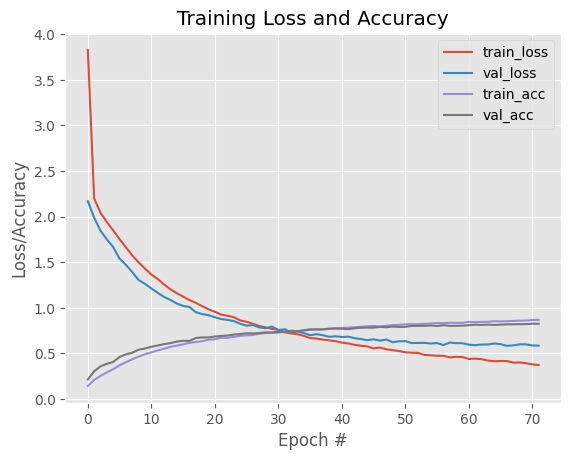

In [91]:
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, 72), history.history["loss"], label="train_loss")
plt.plot(np.arange(0, 72), history.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, 72), history.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, 72), history.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()
plt.show()

In [93]:
from sklearn.metrics import classification_report
x_test_np = np.array(test_df_4)
x_test = np.repeat(x_test_np[..., np.newaxis], 3, -1)
# Evaluando el modelo de predicción con las imágenes de test
print("[INFO]: Evaluando red neuronal...")
predictions = model.predict(test_df_4, batch_size=32)
#print(y_te[0])
#print(predictions[0])
print(classification_report(y_test, predictions.argmax(axis=1)))

[INFO]: Evaluando red neuronal...
204/204 [==============================] - 1s 2ms/step
              precision    recall  f1-score   support

           0       0.73      0.82      0.77       238
           1       0.77      0.75      0.76       794
           2       0.95      0.92      0.93       794
           3       0.97      0.92      0.94       558
           4       0.92      0.87      0.89       731
           5       0.79      0.82      0.80       730
           6       0.74      0.77      0.76       710
           7       0.78      0.72      0.75       495
           8       0.85      0.88      0.86       447
           9       0.85      0.88      0.87       451
          10       0.80      0.84      0.82       559

    accuracy                           0.83      6507
   macro avg       0.83      0.84      0.83      6507
weighted avg       0.84      0.83      0.83      6507

